- Fixed Schema - Tables and Rows - Relational Database/SQL.
    - PostgresSQL
    - MYSQL
    - SQL Server
    - Oracle SQL
- Flexible Schema - Documents, Key-Value, GraphQL - NOSQL
    - Maria DB
    - Cassandra
    - MongoDB

### https://www.postgresql.org/
#### https://www.postgresql.org/download/
- Windows : https://www.postgresql.org/download/windows/ 
- Mac : https://www.postgresql.org/download/macosx/
    - https://formulae.brew.sh/formula/postgresql@14 
- Official installation Guide : https://www.enterprisedb.com/docs/supported-open-source/postgresql/installing/windows/<br>
Port: 5432<br>
Locale: DEFAULT

### Homebrew Installation Steps:
https://formulae.brew.sh/formula/postgresql@14

Install PostgresSQL via Homebrew
- Run this command to install the latest version:
    - brew install postgresql
- If you want a specific version (e.g., version 14):
    - brew install postgresql@14
- Then link it:
    - brew link postgresql@14 --force
- Start the Service:
    - brew services start postgresql@14 
- and then use:
    - psql -U postgres

### Test Installation
psql -U postgres<br>
<Enter Password><br>
SELECT current_user;<br>
\du<br>
\du+<br>
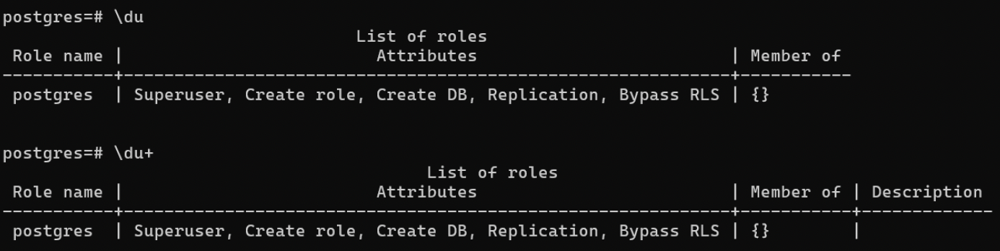

- Check Tables in the Current Database : **\dt** 
- To list all tables, views, and sequences : **\d** 
- To list tables in all schemas : \dt \*.\*
- How to Check Table Schema (Description of a Table) : **\d**
- Information about your current connection : **\conninfo**
- SELECT current_database()
- To quit : **\q**
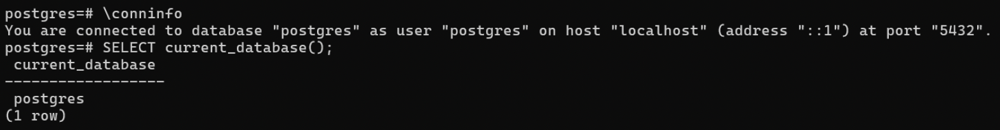

### CREATING NEW USER, NEW DATABASE
- Create new user : **CREATE USER test WITH PASSWORD 'test123';**
- Create New database and make test as owner : **CREATE DATABASE demo1 OWNER test;**

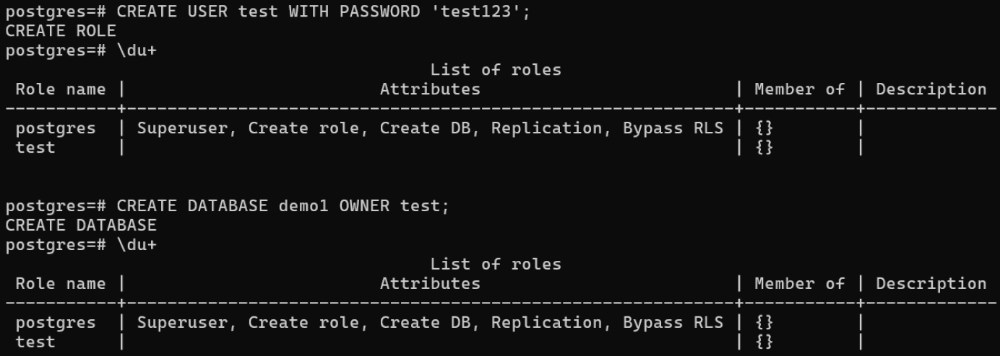

- Verify user test can access demo1 
    - Command : **psql -U test -d demo1**

*If you don't specify a database using the __-d__ option, psql attempts to connect to a database that has the same name as the username you provided.*

### Chinook Database Setup
Download .sql file from here : 
- Github repo : https://github.com/lerocha/chinook-database 
- SQL dump file : https://github.com/lerocha/chinook-database/releases/download/v1.4.5/Chinook_PostgreSql.sql
    - Open the SQL file with VSCode and update line 25: **CREATE DATABASE chinook OWNER test;**
    - Select **utf-8** at right bottom and open with **Western (Windows 1252)**, now select **Western (Windows 1252)** at bottom right and this time save with **utf-8**

- Run scripts using command: **\i C:/Users/scl/Downloads/Chinook_PostgreSql.sql**

**psql -U postgres** and run below commands:
- **GRANT ALL PRIVILEGES ON DATABASE chinook TO test;** -- IT grants CONNECT, CREATE, TEMPORARY
- **GRANT ALL PRIVILEGES ON ALL TABLES IN SCHEMA public TO test;** -- IT grants SELECT, INSERT, UPDATE, DELETE, TRUNCATE, REFERENCES, and TRIGGER
- **GRANT ALL PRIVILEGES ON ALL SEQUENCES IN SCHEMA public TO test;**

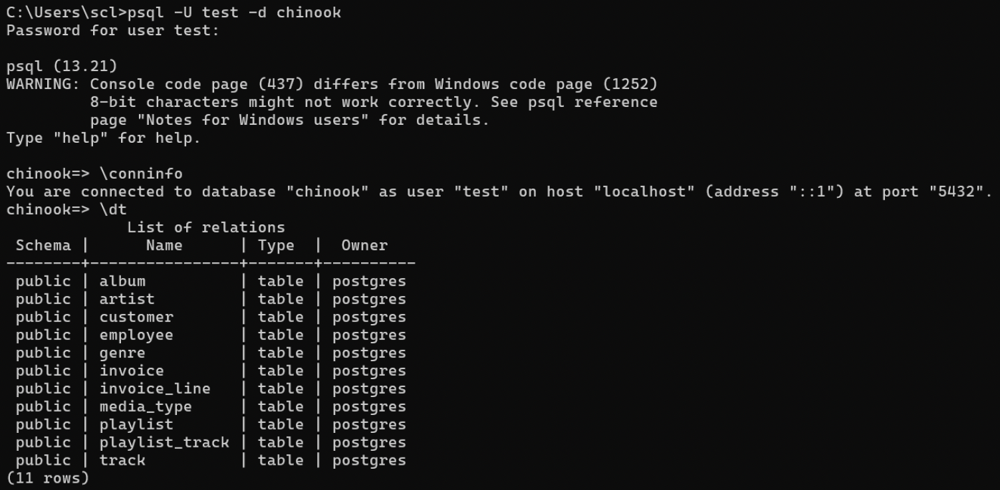

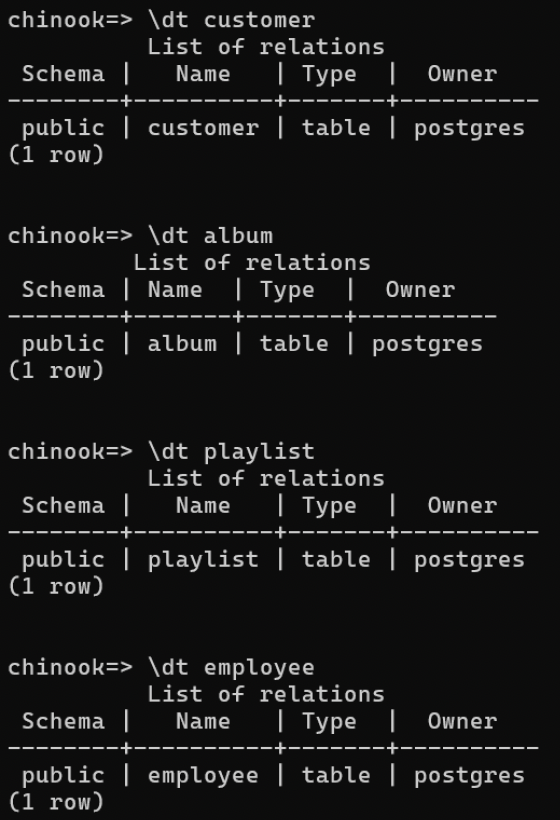

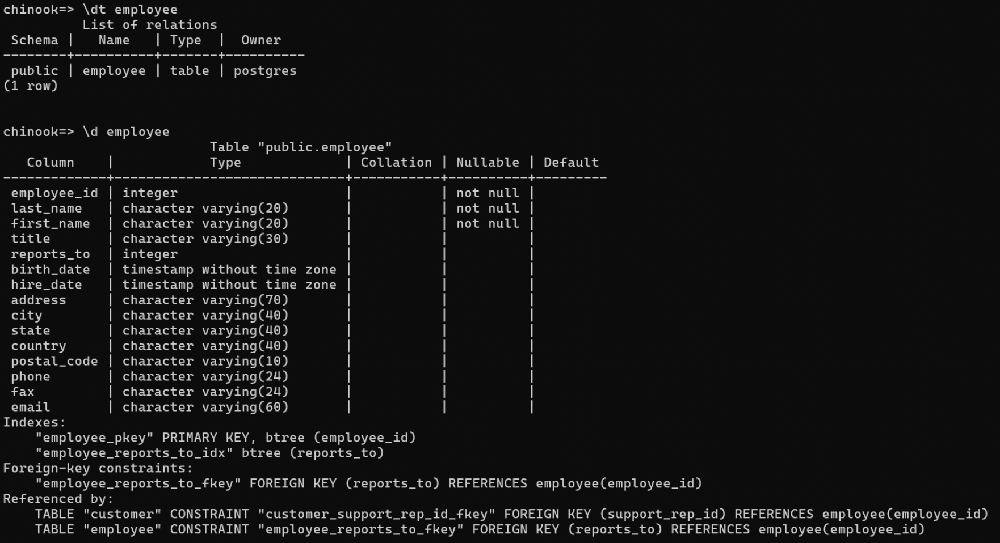

### Basic SQL Commands

**psql -U test -d chinook** and run below commands:
- **READ:** SELECT * FROM Artist;
- **READ:** SELECT * FROM Artist LIMIT 5; 
- **READ from Specific Columns (1):** SELECT Artist_Id, Name FROM Artist;
- **READ from Specific Columns (2):** SELECT Title, Artist_Id FROM Album;
- **CONDITIONAL READ (WHERE clause) (1):** SELECT * FROM Artist WHERE Name = 'Queen';
- **CONDITIONAL READ (WHERE clause) (2):** SELECT Name, Milliseconds FROM Track WHERE Milliseconds > 300000;
- **CONDITIONAL READ (WHERE clause) (3):** SELECT First_Name, Last_Name, Country FROM Customer WHERE Country = 'Canada' OR Country = 'USA';

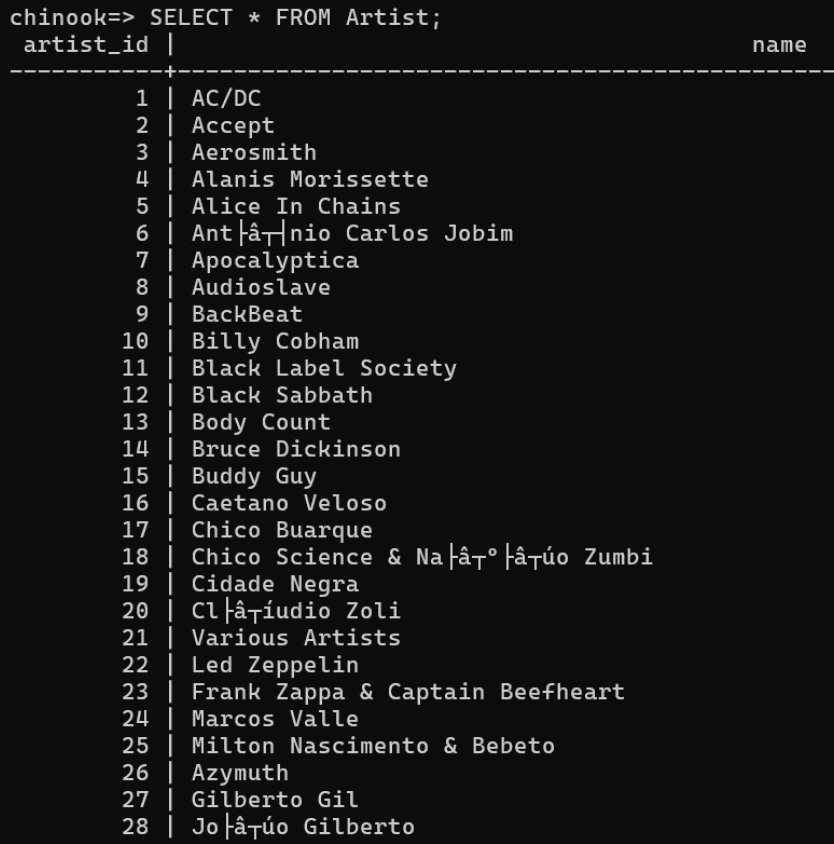

### pgAdmin 4
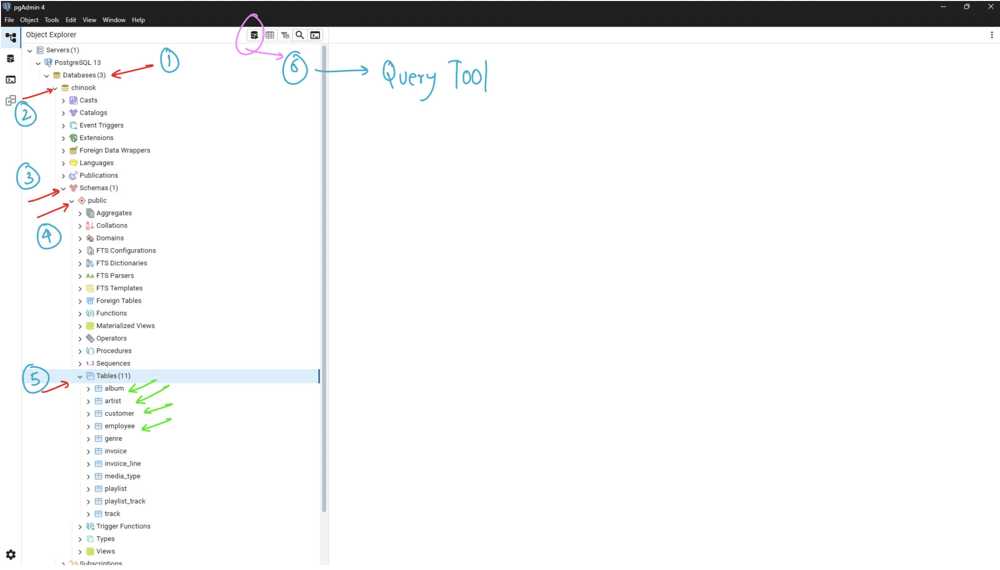

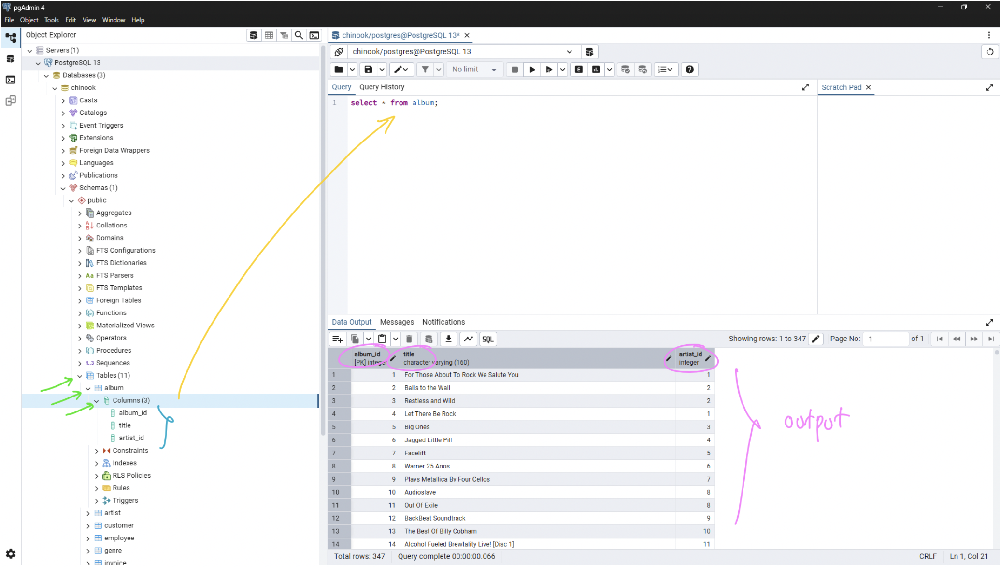

### SQL Commands
SQL Commands are fundamental building blocks for communicating with DBMS.
- DDL - Data Definition Language.
    - used to define, alter, delete database structure.
        - CREATE
        - ALTER
        - DROP
        - RENAME
        - TRUNCATE
- DQL - Data Query Language.
    - Get data out of database.
        - SELECT.
- DML - Data Manipulation Language.
    - control access to data in the database, manipulate.
        - INSERT
        - UPDATE
        - DELETE
        - LOCK
- DCL - Data Control Language.
    - Control access to data in the database, granting or revoking permission.
        - GRANT
        - REVOKE
- TCL - Transaction Control Language.
    - Begin Transaction
    - Commit
    - Rollback


### SELECT CLAUSE
Retrieve data from 1 or more tables.

- SELECT column_name FROM table_name;
- SELECT column_name FROM table_name WHERE condition ORDER BY column_name;
    - SELECT * FROM album WHERE title LIKE 'L%';
- SELECT DISTINCT column_name FROM table_name;

### GROUP BY
Aggregate results by column.
- SELECT column_name, aggregate_function() FROM table_name GROUP BY column_name;
    - e.g., Number of albums per artist.
        - SELECT artist_id, count(*) FROM album GROUP BY artist_id;
        - SELECT artist_id, count(*) FROM album WHERE artist_id < 100;
- HAVING clause - filter after GROUP BY.
    - WHERE - filters rows before the grouping.
    - HAVING - filters groups after the GROUP BY. 
        - SELECT artist_id, count(*) FROM album GROUP BY artist_id HAVING artist_id < 100;

### Database Keys
1. Primary Key - Uniquely identify each row in a table.
    - Cannot be NULL
    - Unique
    - customer_id (Primary Key)
    - when no column is eligible to be primary key then we create 'surrogate key'. In the context of databases, a surrogate key is a unique, system-generated identifier that serves as the primary key for a table, distinct from any natural keys that might exist within the data itself.
2. Candidate Key - any column or combination of columns that can uniquely identify rows.
    - There can be multiple candidate keys.
    - One candidate key is chosen as primary key.
    - examples are customer_id, email, customer_id & phone_no, customer_id & email, customer_id & name, name & email.
3. Alternate Key - any candidate key that was not chosen as the primary key.
4. Composite Key - Primary key made of more than one column.
5. Foreign Key - Column that refers to the primary key of another table.

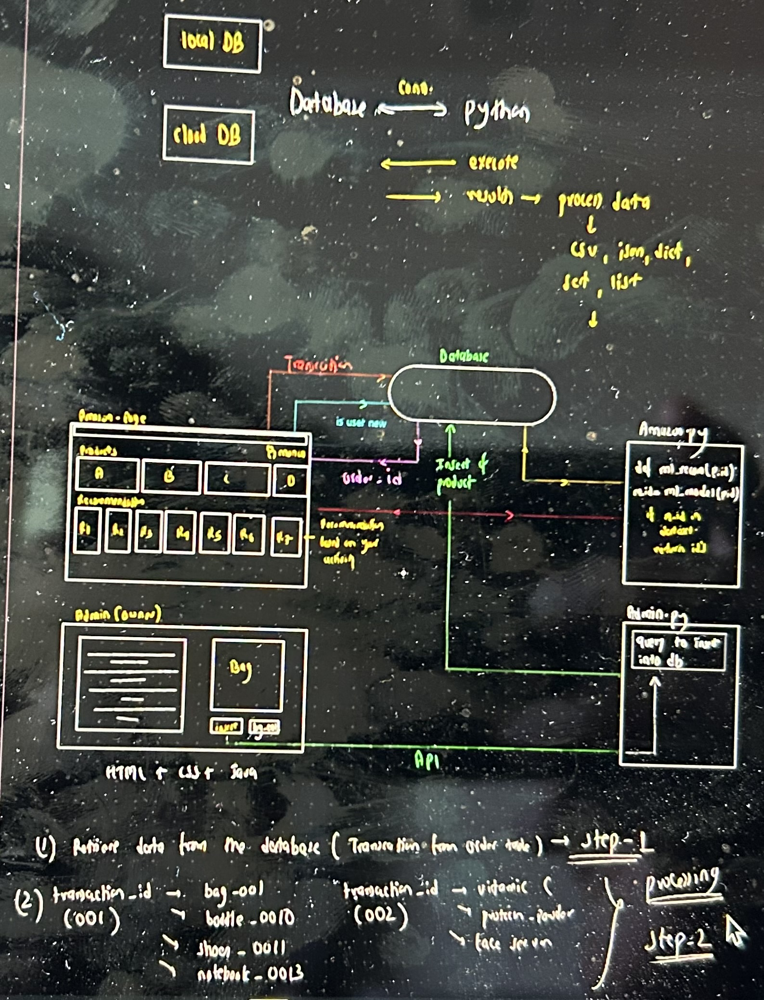

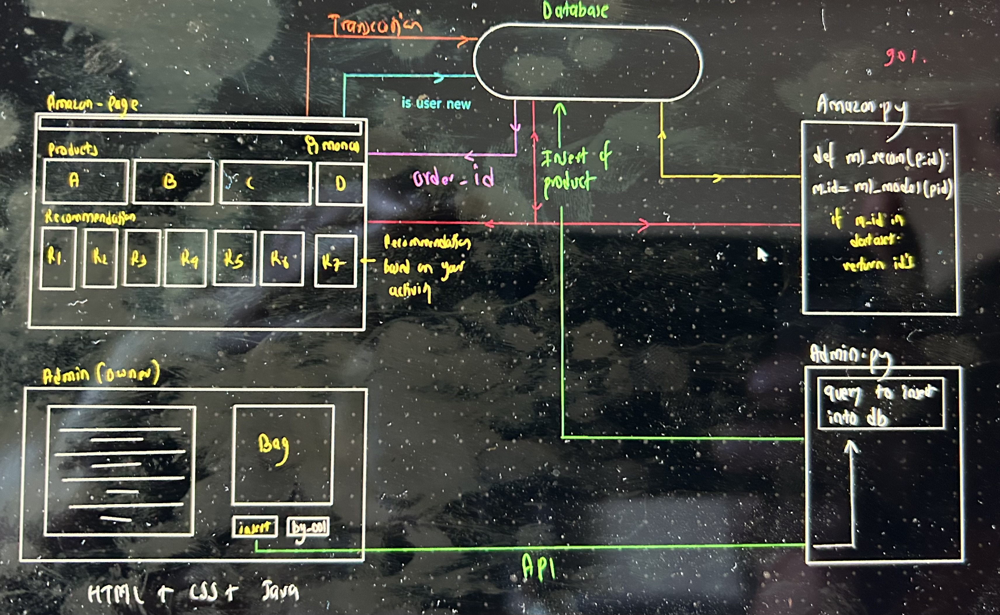

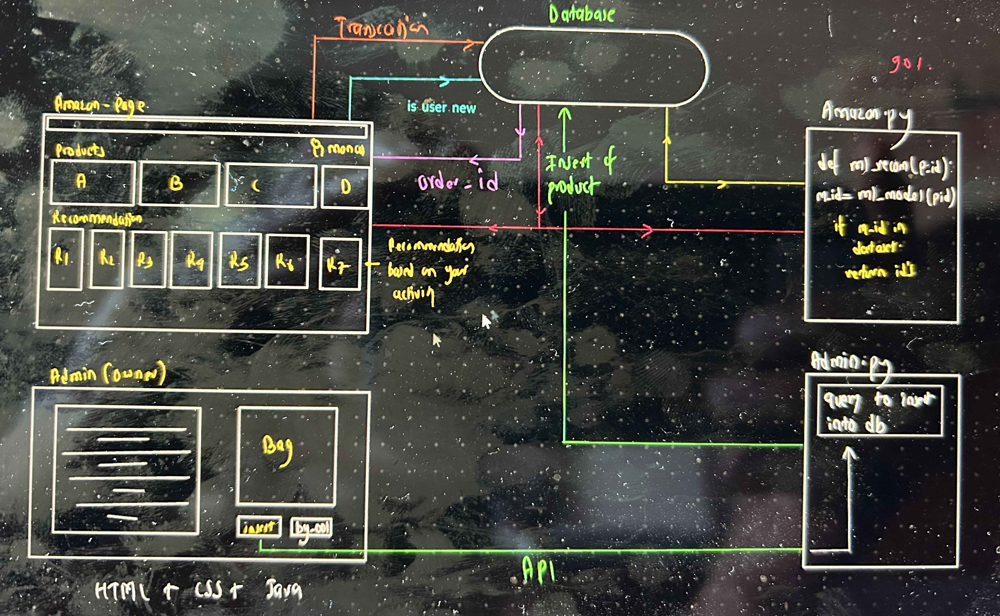

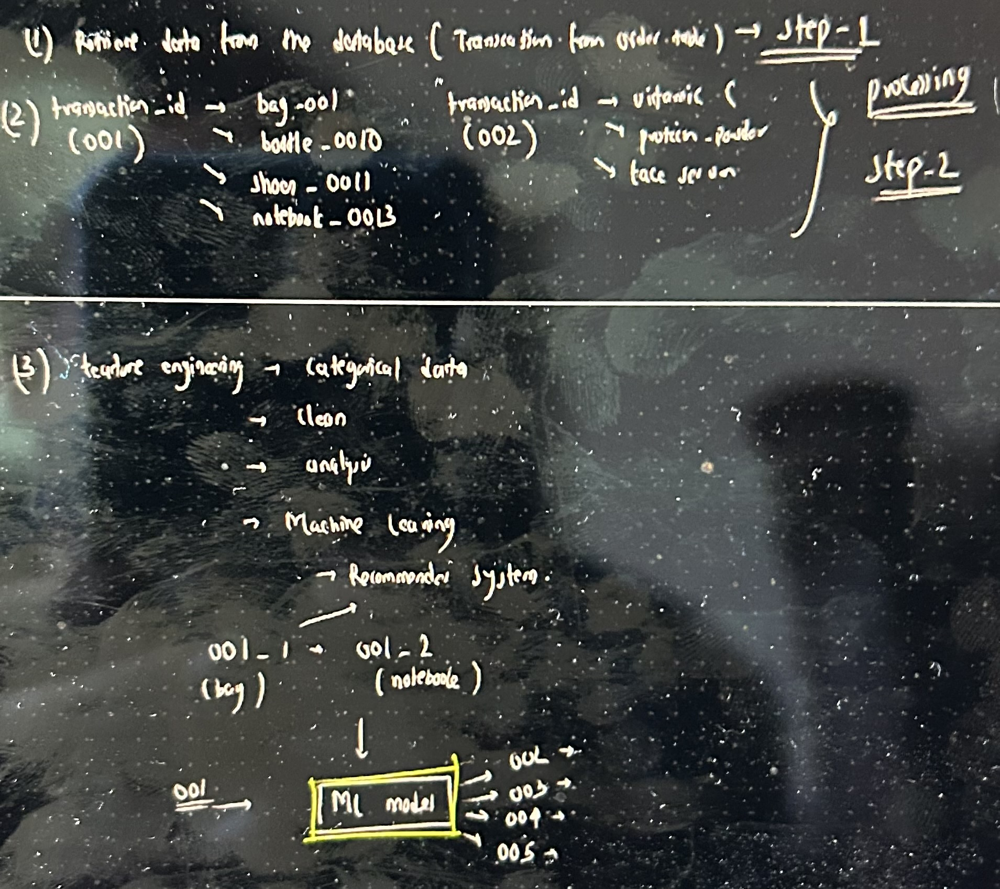

### Python Code to access the database
!pip install psycopg2-binary

In [3]:
!pip install psycopg2-binary

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 22.2 MB/s eta 0:00:00


In [9]:
# Python code to connect to PostgreSQL database - Monal's Version
# Python code to connect to PostgreSQL database - this code reads the database configuration from a JSON file and connects to the PostgreSQL database, executing a simple query to fetch the database version.
# This code assumes that you have a JSON file named 'db_config.json' with the necessary database connection parameters such as host, database, user, and password.
# The code handles exceptions for reading the configuration file and connecting to the database, and it prints the database version if the connection is successful. Finally, it closes the cursor and connection to the database.
# This code is useful for establishing a connection to a PostgreSQL database using Python, which is a common task in data analysis, web development, and application development.
# 1) connection -> DB
# 2) connection -> cursor -> SQL (running query to the DB)
# 3) cursor (query) -> fetchone() or fetchall() -> data
# 4) cursor.close() -> connection.close() -> close the connection to the DB
# 5) If you don't close the connection, it will keep running in the background and
#    you will not be able to connect to the DB again.
# 6) If you want to run the same query again, you need to create a new cursor
# 7) If you want to run a different query, you can use the same cursor
# 8) If you want to run a different query, you can create a new cursor
# 9) If you want to run the same query again, you can use the same cursor
import psycopg2
import json

def read_db_config(config_file='db_config.json'):
    try:
        with open(config_file, 'r') as f:
            config = json.load(f)
        print(f'Database config loaded from file {config_file}')
        return config
    except Exception as e:
        print(f'Error occurred while reading from json file: {config_file}, Exception: {e}')

def connect_to_postgres(host, port, database, user, password):
    connection = None

    try:
        connection = psycopg2.connect(
              host=host,
              port=port,
              database=database,
              user=user,
              password=password
            )
        print(f'Connected to PostgreSQL database {database} successfully')
    except Exception as e:
        print(f'Error occurred while connecting to PostgreSQL database connection to DB {database}, Exception: {e}')
    
    return connection

def execute_query(connection, query, params=None):
    try:
        cursor = connection.cursor()
        cursor.execute(query, params)  # Execute the query with optional parameters
        if query.strip().lower().startswith('select'):
            # If the query is a SELECT statement, fetch the results
            #result = cursor.fetchone()  # Fetch one row
            result = cursor.fetchall()
            print(f'Query executed successfully: {query}')
            return result
    except Exception as e:
        print(f'Error occurred while executing query: {query}, Exception: {e}')
    finally:
        cursor.close()

# Read database configuration from JSON file
db_config = read_db_config()
if db_config:
    DB_HOST = db_config.get('host')
    DB_PORT = db_config.get('port')
    DB_NAME = db_config.get('database')
    DB_USER = db_config.get('user')
    DB_PASSWORD = db_config.get('password')
    # Connect to PostgreSQL database
    connection = connect_to_postgres(DB_HOST, DB_PORT, DB_NAME, DB_USER, DB_PASSWORD)
    if connection:
        # Execute a simple query to fetch the database version
        query = 'SELECT * FROM album;'
        result = execute_query(connection, query)
        if result:
            id = 1
            for album_id, title, artist_id in result:
                print(f'ID: {id} Album ID: {album_id}, Title: {title}, Artist ID: {artist_id}')
                id += 1
        else:
            print('No results found for the query.')

        # Close the connection
        connection.close()
        print('Connection closed.')


Database config loaded from file db_config.json
Connected to PostgreSQL database chinook successfully
Query executed successfully: SELECT * FROM album;
ID: 1 Album ID: 1, Title: For Those About To Rock We Salute You, Artist ID: 1
ID: 2 Album ID: 2, Title: Balls to the Wall, Artist ID: 2
ID: 3 Album ID: 3, Title: Restless and Wild, Artist ID: 2
ID: 4 Album ID: 4, Title: Let There Be Rock, Artist ID: 1
ID: 5 Album ID: 5, Title: Big Ones, Artist ID: 3
ID: 6 Album ID: 6, Title: Jagged Little Pill, Artist ID: 4
ID: 7 Album ID: 7, Title: Facelift, Artist ID: 5
ID: 8 Album ID: 8, Title: Warner 25 Anos, Artist ID: 6
ID: 9 Album ID: 9, Title: Plays Metallica By Four Cellos, Artist ID: 7
ID: 10 Album ID: 10, Title: Audioslave, Artist ID: 8
ID: 11 Album ID: 11, Title: Out Of Exile, Artist ID: 8
ID: 12 Album ID: 12, Title: BackBeat Soundtrack, Artist ID: 9
ID: 13 Album ID: 13, Title: The Best Of Billy Cobham, Artist ID: 10
ID: 14 Album ID: 14, Title: Alcohol Fueled Brewtality Live! [Disc 1], Artis

In [ ]:
# Python code to connect to PostgreSQL database - Copilot's Version
# Python code to connect to PostgreSQL database - this code reads the database configuration from a JSON file and connects to the PostgreSQL database, executing a simple query to fetch the database version.
# This code assumes that you have a JSON file named 'db_config.json' with the necessary database connection parameters such as host, database, user, and password.
# The code handles exceptions for reading the configuration file and connecting to the database, and it prints the database version if the connection is successful. Finally, it closes the cursor and connection to the database.
# This code is useful for establishing a connection to a PostgreSQL database using Python, which is a common task in data analysis, web development, and application development.
import psycopg2
import json

def read_db_config(config_file='db_config.json'):
    try:
        with open(config_file, 'r') as f:
            config = json.load(f)
        print(f'Database config loaded from file {config_file}')
        return config
    except Exception as e:
        print(f'Error occurred while reading from json file: {config_file}, Exception: {e}')

def connect_to_db(config):
    try:
        conn = psycopg2.connect(**config)
        print('Connection to the database established successfully.')
        return conn
    except Exception as e:
        print(f'Error occurred while connecting to the database: {e}')
        return None
    
def main():
    config = read_db_config()
    if not config:
        return
    
    conn = connect_to_db(config)
    if not conn:
        return
    
    try:
        cursor = conn.cursor()
        cursor.execute("SELECT version();")
        db_version = cursor.fetchone()
        print(f'Database version: {db_version[0]}')
        
    except Exception as e:
        print(f'Error occurred while executing query: {e}')
    
    finally:
        cursor.close()
        conn.close()
        print('Database connection closed.')

if __name__ == '__main__':
    main()

Database config loaded from file db_config.json
Connection to the database established successfully.
Database version: PostgreSQL 17.4 on aarch64-unknown-linux-gnu, compiled by gcc (GCC) 13.2.0, 64-bit
Database connection closed.
